<a href="https://colab.research.google.com/github/ibonetc/Finance_ML/blob/main/ML_Finance_ExampleClassification_pycaret.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Ejemplo de uso de pycaret

Vamos a usar la base de datos de UCI llamada [Default of Credit Card Clientes Dataset](https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients) 

El conjunto de datos de clientes de tarjetas de crédito predeterminados. Este conjunto de datos contiene información sobre pagos predeterminados, factores demográficos, datos crediticios, historial de pagos y extractos de facturación de clientes de tarjetas de crédito en Taiwán desde abril de 2005 hasta septiembre de 2005. Hay 24.000 muestras y 25 características. Las descripciones breves de cada columna son las siguientes:


*   DNI: DNI de cada cliente
*   LIMIT_BAL: monto del crédito otorgado en dólares NT (incluye crédito individual y familiar/suplementario)
*   SEXO: Género (1=masculino, 2=femenino)
*   EDUCACIÓN: (1=graduado, 2=universidad, 3=bachillerato, 4=otros, 5=desconocido, 6=desconocido)
*   MATRIMONIO: Estado civil (1=casado, 2=soltero, 3=otros)
*   EDAD: Edad en años
*   PAY_0 a PAY_6: estado de pago hace n meses (PAY_0 = último mes... PAY_6 = hace 6 meses) (Etiquetas: -1=pago debidamente, 1=retraso en el pago de un mes, 2=retraso en el pago de dos meses,... 8= retraso en el pago de ocho meses, 9 = retraso en el pago de nueve meses o más)
*   BILL_AMT1 a BILL_AMT6: Importe del estado de cuenta de hace n meses ( BILL_AMT1 = último_mes .. BILL_AMT6 = hace 6 meses)
*   PAY_AMT1 a PAY_AMT6: Monto de pago por n meses atrás ( BILL_AMT1 = last_month .. BILL_AMT6 = 6 meses atrás)
*   default: Moroso (1=sí, 0=no) Columna objetivo

In [ ]:
!pip install pycaret

In [ ]:
!pip install explainerdashboard
!pip install autoviz

In [ ]:
!pip install markupsafe==2.0.1
import jinja2

In [4]:
from pycaret.utils import enable_colab
enable_colab

<function pycaret.utils.enable_colab>

In [15]:
from pycaret.datasets import get_data
dataset = get_data('credit')

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
0,20000,2,2,1,24,2,2,-1,-1,-2,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,90000,2,2,2,34,0,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
2,50000,2,2,1,37,0,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
3,50000,1,2,1,57,-1,0,-1,0,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
4,50000,1,1,2,37,0,0,0,0,0,...,19394.0,19619.0,20024.0,2500.0,1815.0,657.0,1000.0,1000.0,800.0,0


## Análisis de los datos

### **Distribución de los casos según la clase (default)**
Porciento de morosos vs los no morosos

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

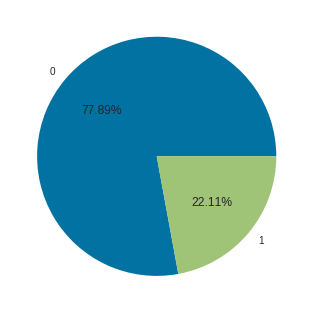

In [16]:
plt.pie(dataset['default'].value_counts(), labels = [0, 1], autopct='%.2f%%');

### **Cantidad por clases según el rasgo de sexo**

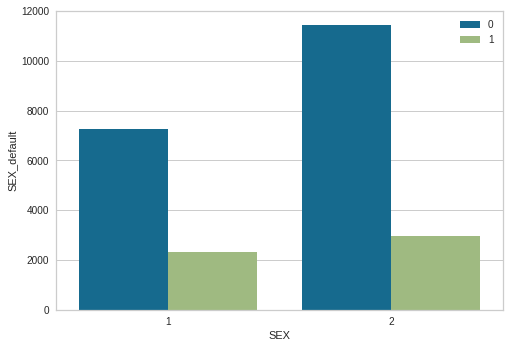

In [19]:
dfg = dataset.groupby(['SEX','default']).size().reset_index(name='SEX_default')
sns.barplot(x='SEX', y='SEX_default', data=dfg, hue='default')
plt.legend(loc='upper right');

### **Cantidad por clases según el rasgo de education**

EDUCACIÓN: (1=graduado, 2=universidad, 3=bachillerato, 4=otros, 5=desconocido, 6=desconocido)

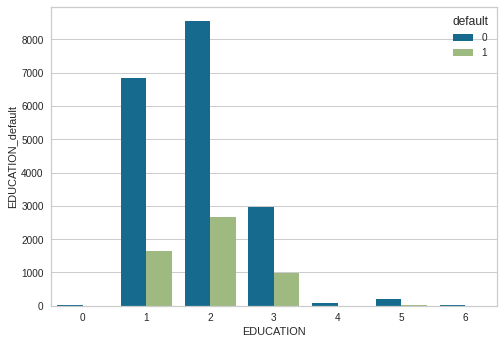

In [32]:
dfg = dataset.groupby(['EDUCATION','default']).size().reset_index(name='EDUCATION_default')
ax = sns.barplot(x='EDUCATION', y='EDUCATION_default', data=dfg, hue='default')

### **Pairplot**

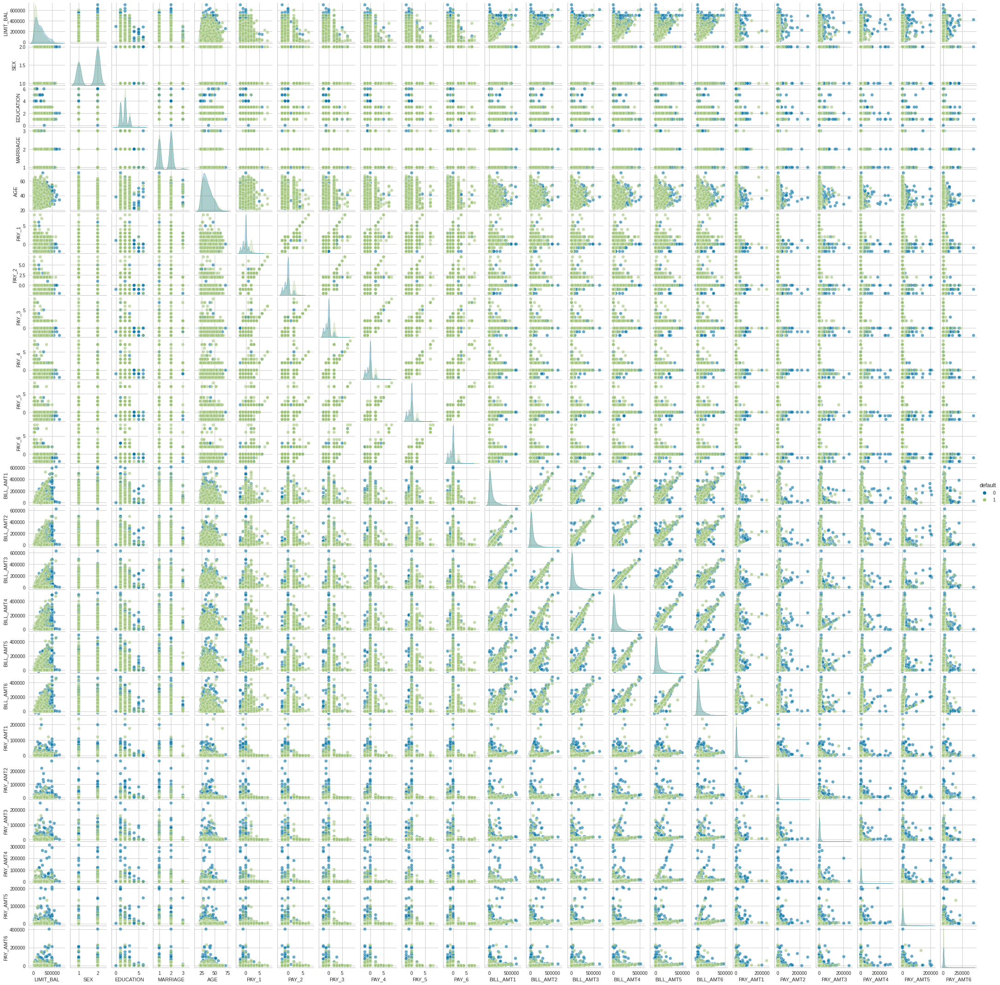

In [23]:
df_sample = dataset.groupby('default', group_keys=False).apply(lambda x: x.sample(1000))
g = sns.pairplot(df_sample, hue='default', plot_kws={'alpha':0.6})
g.fig.set_size_inches(30,30)

### **Análisis de correlación**

**Phik**: coeficiente de correlación práctico basado en varios refinamientos a la prueba de hipótesis de independencia de dos variables de Pearson

**Networkx**: paquete de python para la creación, manipulación y estudio de la estructura, dinámica y funciones de redes complejas


In [29]:
import phik
from phik import resources
from phik.binning import bin_data
from phik.decorators import *
from phik.report import plot_correlation_matrix
import networkx as nx

In [24]:
categorical = list(dataset.select_dtypes(include ='object').columns)

In [26]:
numerical = list(dataset.drop('default', axis = 1).select_dtypes(include =['int64', 'float64']).columns)

In [ ]:
numerical

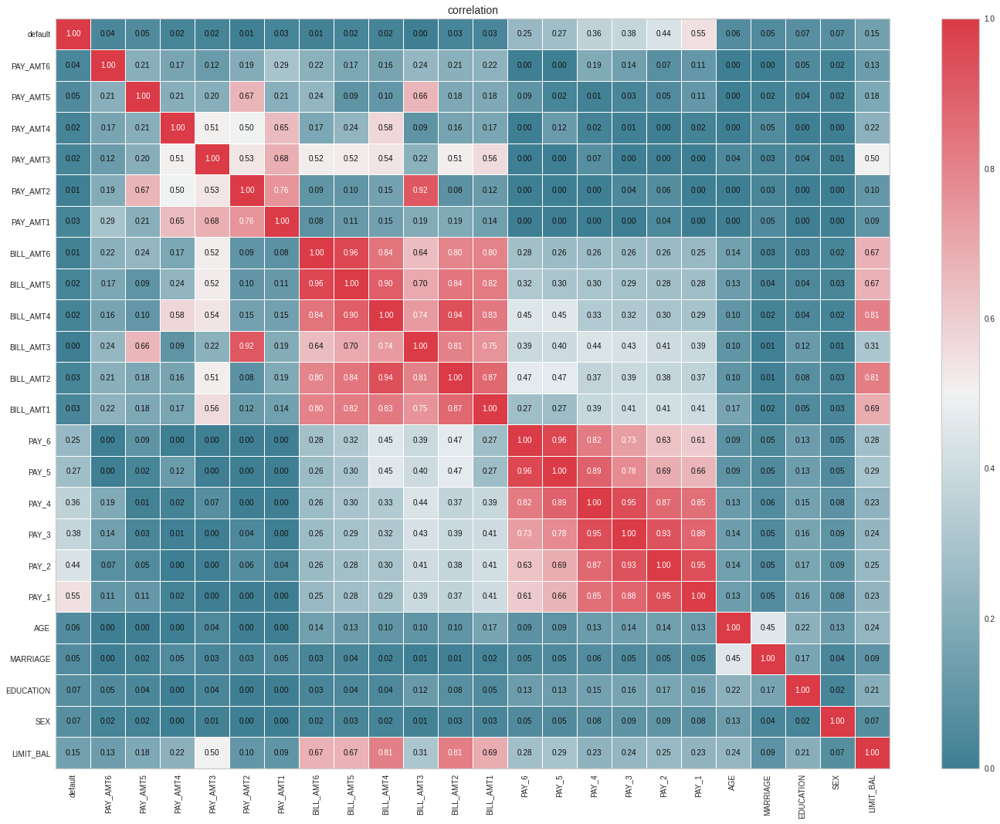

In [30]:
coerr_mat = dataset.phik_matrix(interval_cols = numerical + ['default'])
cmap = sns.diverging_palette(220, 10, as_cmap=True)

plot_correlation_matrix(coerr_mat.values, x_labels=coerr_mat.columns, y_labels=coerr_mat.index, 
                        vmin=0, vmax=1, color_map=cmap, figsize=(20, 15));

### Correlación como grafo

In [39]:
class GraphVisualization:
  def __init__(self):
    self.visual = []
    
  def addEdge(self, a, b):
    temp = [a, b]
    self.visual.append(temp)
  
  def visualize(self):
    G = nx.Graph()
    G.add_edges_from(self.visual)
    for i in list(G.nodes()):
        G.nodes[i]['corr_target'] = coerr_mat['default'][i]        
    node_color = [20 * nx.get_node_attributes(G, 'corr_target')[v] for v in G]
    nx.draw_shell(G, node_size=2750, node_color = node_color, alpha = 0.7, with_labels = True, edge_color ='0', cmap = cmap, font_size=9)
    plt.figure(figsize=(10, 10))
    plt.show()

In [40]:
df=dataset

In [41]:
G = GraphVisualization()
for col1 in df.columns:
  for col2 in df.columns:
    if col1 != col2 and col1 != 'default' and col2 != 'default':
      if coerr_mat[col1][col2] > 0.75:
        G.addEdge(col1,col2)

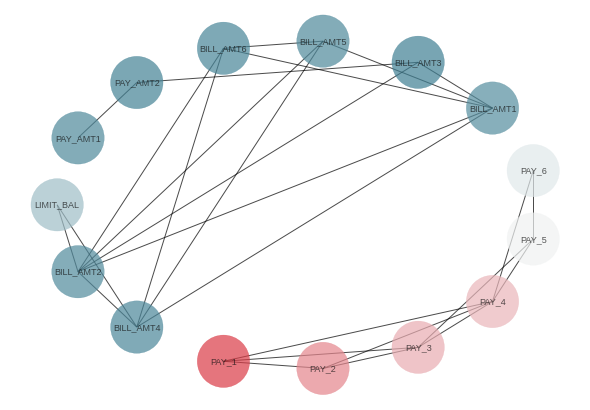

<Figure size 720x720 with 0 Axes>

In [42]:
G.visualize();

### **Valores nulos**

Aunque en esta base de datos no tenemos valores nulos, como se mostrará abajo, es importante saber qué variables y cuántos valores nules tenemos

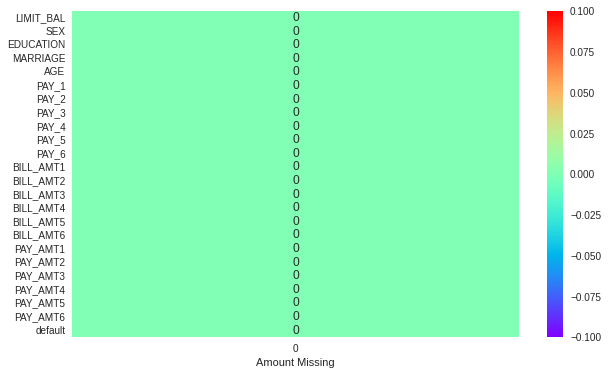

In [31]:
plt.figure(figsize=(10, 6))
ax = sns.heatmap(dataset.isnull().sum().to_frame(), annot=True, fmt = 'd', cmap = 'rainbow')
ax.set_xlabel('Amount Missing');

## División de los datos en entrenamiento, prueba y validación
Escogeremos un 5% de los datos para validación, del resto un 75% para entrenamiento (con validación cruzada) y un 15% para prueba

In [43]:
data = dataset.sample(frac=0.95, random_state=7) # dejando un 5% para validación
validation_data = dataset.drop(data.index)
data.reset_index(inplace=True, drop=True)
validation_data.reset_index(inplace=True, drop=True)

In [7]:
data

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
0,50000,1,2,1,34,0,0,0,0,0,...,14234.0,19545.0,20173.0,2023.0,3105.0,3119.0,11000.0,909.0,3000.0,0
1,440000,1,1,1,37,-1,-1,-1,-1,-1,...,396.0,600.0,3596.0,8369.0,16786.0,396.0,600.0,3596.0,4095.0,0
2,110000,2,1,1,37,-1,-1,0,0,0,...,50418.0,48093.0,3389.0,54300.0,6600.0,400.0,4000.0,1771.0,0.0,1
3,200000,1,3,1,36,-1,2,-1,0,0,...,28367.0,28721.0,20139.0,4.0,24846.0,5004.0,1540.0,4.0,6411.0,1
4,50000,1,2,1,49,0,0,0,0,0,...,37192.0,39341.0,27561.0,2000.0,3500.0,3000.0,3000.0,5000.0,5000.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22795,230000,2,2,1,34,0,-1,-1,-1,-1,...,2350.0,103030.0,380.0,380.0,380.0,2350.0,103030.0,380.0,1570.0,0
22796,180000,1,2,2,33,0,0,0,0,0,...,111065.0,122028.0,125069.0,4100.0,4400.0,10000.0,12900.0,5000.0,5000.0,0
22797,50000,1,2,1,35,-1,2,0,0,0,...,16884.0,18070.0,19218.0,0.0,2100.0,2000.0,2000.0,2000.0,2000.0,1
22798,20000,2,2,1,29,0,0,0,0,0,...,8472.0,8640.0,8971.0,1268.0,1284.0,1141.0,309.0,470.0,321.0,1


In [8]:
validation_data

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
0,360000,2,1,2,26,0,0,0,0,0,...,33100.0,180000.0,196.0,4796.0,3400.0,3100.0,146900.0,196.0,2963.0,0
1,360000,1,2,1,35,1,-2,-2,-2,-2,...,-103.0,-103.0,-103.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,50000,2,2,2,22,-1,0,0,0,0,...,7457.0,3115.0,7725.0,15000.0,1000.0,149.0,0.0,5000.0,10000.0,0
3,100000,2,2,1,38,1,2,0,0,2,...,16268.0,15868.0,16448.0,0.0,1600.0,1500.0,0.0,1000.0,1500.0,1
4,210000,2,2,1,41,-1,-1,-1,-1,-1,...,3763.0,877.0,0.0,1586.0,343.0,3763.0,877.0,0.0,419.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,250000,1,1,1,34,0,0,0,0,0,...,7277.0,4972.0,2609.0,1131.0,4000.0,3000.0,99.0,1000.0,6000.0,1
1196,30000,1,1,2,33,-1,3,2,-1,0,...,29498.0,27025.0,0.0,0.0,0.0,31200.0,541.0,0.0,0.0,1
1197,130000,1,3,1,45,-1,-1,-1,-1,-1,...,2756.0,1585.0,1215.0,1826.0,2831.0,2756.0,1585.0,1215.0,2402.0,1
1198,230000,1,1,2,44,-2,-1,-1,-1,-1,...,1467.0,9192.0,4388.0,3306.0,806.0,1500.0,9216.0,4388.0,0.0,0


In [44]:
dataset.shape

(24000, 24)

In [45]:
data.shape

(22800, 24)

In [46]:
validation_data.shape

(1200, 24)

In [12]:
from pycaret.classification import *

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


## Configuración del entorno de Pycaret

La función setup() inicializa el entorno de pycaret y crea el pipeline de transformación para preparar los datos para el modelado. Esta función debe ser llamada antes de ejecutar cualquier otra función. 

Tiene dos parámetros obligatorios:

* data: donde deben pasarse los datos
* target: el nombre de la columna objetivo.

Además tiene otras como:

* train_size: para dar el tamaño del conjunto de entrenamiento, que por defecto es 70% (0.7)
* la validación k-fold, por defecto está en k=10
* session_id: es la semilla aletoria para la división de los datos.

In [47]:
s = setup(data = data, target = 'default', session_id=7,train_size=0.75)

,Description,Value
0,session_id,7
1,Target,default
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(22800, 24)"
5,Missing Values,False
6,Numeric Features,14
7,Categorical Features,9
8,Ordinal Features,False
9,High Cardinality Features,False


## Modelos que trae el paquete

In [48]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


## Comparar los modelos

La función *compare_model()* permite hacer una validación cruzada de 10 fold por defecto.

La salida imprime el resultado de las métricas: Exactitud (Accuracy), AUC, Recall, Precisión, F1, Kappa, y MCC, y los tiempos de entrenamiento.

Por defecto ordena por Accuracy, aunque uno puede cambiar este parámetro

In [49]:
best=compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lda,Linear Discriminant Analysis,0.8230,0.7659,0.3771,0.6694,0.4823,0.3855,0.4086,0.342
ridge,Ridge Classifier,0.8226,0.0000,0.3600,0.6775,0.4700,0.3753,0.4024,0.127
lightgbm,Light Gradient Boosting Machine,0.8223,0.7785,0.3787,0.6646,0.4823,0.3847,0.4070,0.488
gbc,Gradient Boosting Classifier,0.8219,0.7829,0.3589,0.6750,0.4685,0.3733,0.4003,6.233
ada,Ada Boost Classifier,0.8181,0.7726,0.3338,0.6678,0.4449,0.3504,0.3806,1.433
rf,Random Forest Classifier,0.8179,0.7636,0.3667,0.6476,0.4680,0.3682,0.3900,3.449
et,Extra Trees Classifier,0.8093,0.7407,0.3742,0.6030,0.4616,0.3535,0.3684,2.700
lr,Logistic Regression,0.7813,0.6457,0.0008,0.3000,0.0016,0.0009,0.0099,1.215
dummy,Dummy Classifier,0.7813,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.022
knn,K Neighbors Classifier,0.7530,0.6041,0.1701,0.3627,0.2315,0.1067,0.1176,1.245


In [50]:
bestRecall=compare_models(sort='Recall')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
nb,Naive Bayes,0.3691,0.6373,0.8738,0.2405,0.3772,0.0522,0.1040,0.052
qda,Quadratic Discriminant Analysis,0.5359,0.5455,0.5627,0.2605,0.3426,0.0702,0.0803,0.173
dt,Decision Tree Classifier,0.7289,0.6139,0.4092,0.3867,0.3975,0.2228,0.2230,0.396
lightgbm,Light Gradient Boosting Machine,0.8223,0.7785,0.3787,0.6646,0.4823,0.3847,0.4070,0.428
lda,Linear Discriminant Analysis,0.8230,0.7659,0.3771,0.6694,0.4823,0.3855,0.4086,0.334
et,Extra Trees Classifier,0.8093,0.7407,0.3742,0.6030,0.4616,0.3535,0.3684,2.763
rf,Random Forest Classifier,0.8179,0.7636,0.3667,0.6476,0.4680,0.3682,0.3900,3.373
ridge,Ridge Classifier,0.8226,0.0000,0.3600,0.6775,0.4700,0.3753,0.4024,0.053
gbc,Gradient Boosting Classifier,0.8219,0.7829,0.3589,0.6750,0.4685,0.3733,0.4003,6.169
ada,Ada Boost Classifier,0.8181,0.7726,0.3338,0.6678,0.4449,0.3504,0.3806,1.422


## Crear un modelo de Regresión Logística

La función *create_model()* entrena y evalúa un modelo, utilizando validación cruzada, esto se puede establecer en el parámetro fold.

La salida imprime varias métricas como: AUC, Recall, F1, Kappa y MCC

In [9]:
logit = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7825,0.6445,0.0027,1.0000,0.0053,0.0042,0.0458
1,0.7807,0.6549,0.0000,0.0000,0.0000,-0.0012,-0.0128
2,0.7813,0.6493,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.7819,0.6524,0.0027,1.0000,0.0053,0.0042,0.0457
4,0.7819,0.6620,0.0027,1.0000,0.0053,0.0042,0.0457
5,0.7807,0.6197,0.0000,0.0000,0.0000,-0.0012,-0.0128
6,0.7813,0.6366,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.7813,0.6519,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.7807,0.6233,0.0000,0.0000,0.0000,-0.0012,-0.0128


El modelo entrenado es almacenado en la variable logit

In [9]:
print(logit)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=7, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


### Visualizar resultados


#### Gráfica de entrenamiento

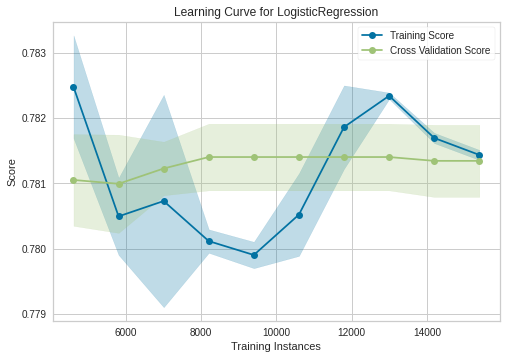

In [14]:
plot_model(logit, plot = 'learning', use_train_data = True)

#### Gráfrica de error

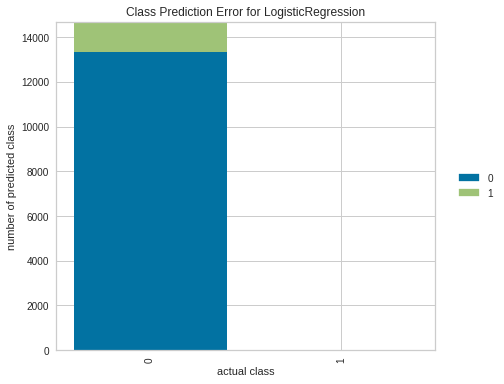

In [15]:
plot_model(logit, plot = 'error', use_train_data = True)

#### Matriz de confusion

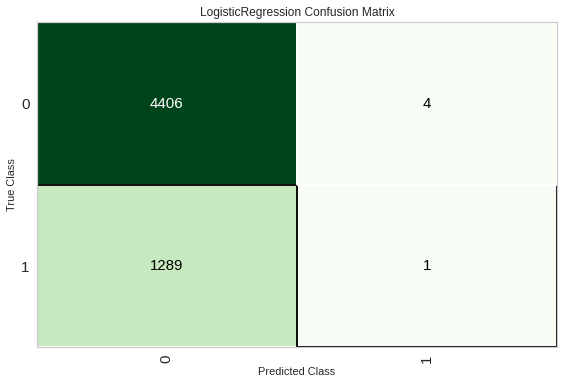

In [16]:
plot_model(logit , plot = 'confusion_matrix')

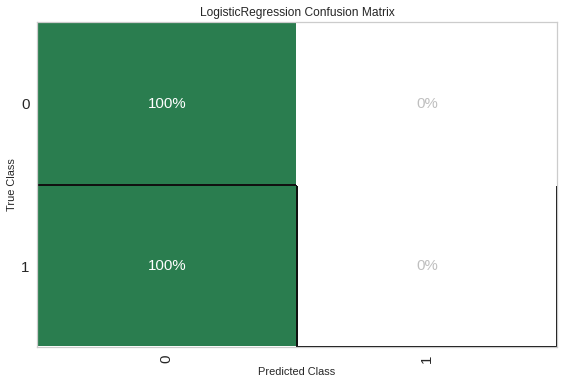

In [17]:
plot_model(logit , plot = 'confusion_matrix', plot_kwargs = {'percent' : True})

### Dashboard

Con este dashboard en http://127.0.0.1:8050/ se puede ver resultados explicativos, como la importancia de los rasgos en el modelo, métricas del modelo resumidas, predicciones individuales

In [10]:
from dash import html
from dash import dcc

In [11]:
dashboard(logit)

Note: model_output='probability' is currently not supported for linear classifiers models with shap. So defaulting to model_output='logodds' If you really need probability outputs use shap='kernel' instead.
Note: shap values for shap='linear' get calculated against X_background, but paramater X_background=None, so using X instead...
Generating self.shap_explainer = shap.LinearExplainer(model, X)...
Building ExplainerDashboard..
Detected google colab environment, setting mode='external'
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
The explainer object has no decision_trees property. so setting decision_trees=False...
Generating layout...
Calculating shap values...
Calculating prediction probabilities...
Calculating metrics...
Calculating confusion matrices...
Calculating classification_dfs...
Calculating roc auc curves...
Calculating pr auc curves...
Calculating liftcurve_dfs...
Calculating dependencies...
Calculating permutation 

<IPython.core.display.Javascript object>

In [21]:
%matplotlib inline
eda()

Shape of your Data Set loaded: (22800, 24)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    23 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################
Not able to read or load file. Please check your inputs and try again...


## Crear un modelo Árbol de Desición

In [51]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7304,0.6212,0.4263,0.3916,0.4082,0.2341,0.2344
1,0.7298,0.6211,0.4278,0.3922,0.4092,0.2345,0.2349
2,0.7269,0.6057,0.3904,0.3792,0.3847,0.2093,0.2093
3,0.7409,0.6349,0.4439,0.4140,0.4284,0.2612,0.2614
4,0.7199,0.5991,0.3850,0.3664,0.3755,0.1951,0.1952
5,0.7304,0.6099,0.3957,0.3864,0.3910,0.2179,0.2180
6,0.7216,0.6044,0.3930,0.3712,0.3818,0.2024,0.2025
7,0.7246,0.6129,0.4144,0.3808,0.3969,0.2189,0.2192
8,0.7374,0.6130,0.3930,0.3984,0.3957,0.2280,0.2280


In [52]:
print(dt)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=7, splitter='best')


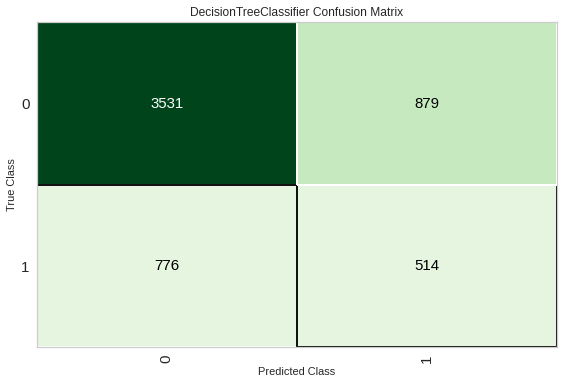

In [55]:
plot_model(dt , plot = 'confusion_matrix')

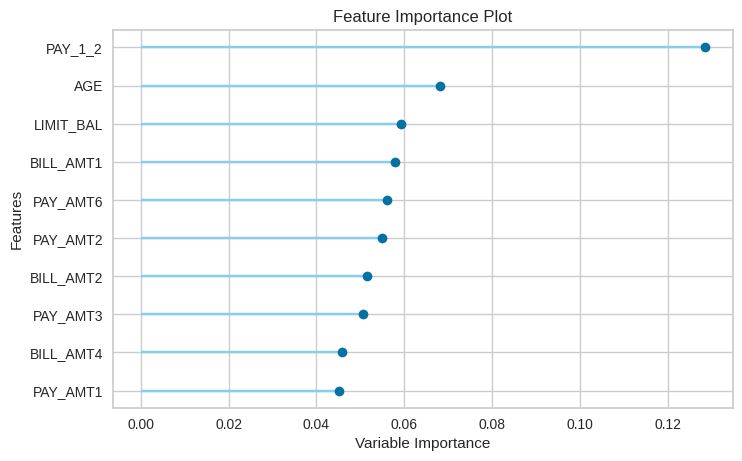

In [56]:
plot_model(dt,plot = 'feature')

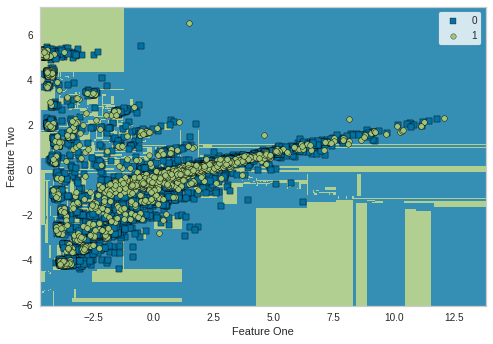

In [57]:
plot_model(dt, plot = 'boundary')

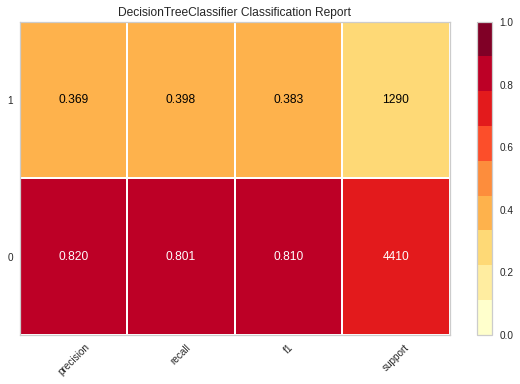

In [58]:
plot_model(dt, plot = 'class_report')

### Interpretación basada en Shap

https://shap.readthedocs.io/en/latest/

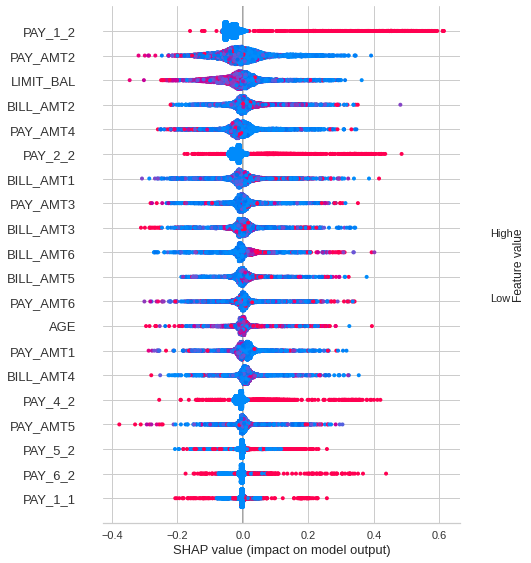

In [59]:
interpret_model(dt)

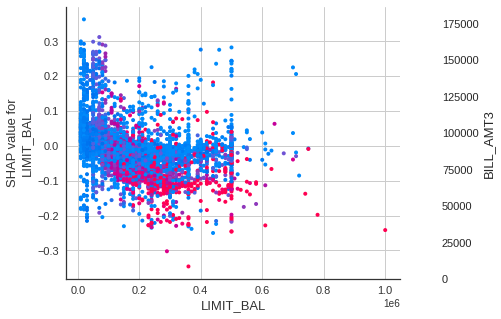

In [60]:
interpret_model(dt, plot = 'correlation')

In [66]:
evaluate_model(dt)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

## Predecir con el modelo

In [67]:
predict_model(dt)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.7096,0.5998,0.3984,0.369,0.3832,0.1937,0.1939


,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,...,PAY_6_2,PAY_6_3,PAY_6_4,PAY_6_5,PAY_6_6,PAY_6_7,PAY_6_8,default,Label,Score
0,20000.0,39.0,15299.0,14112.0,11221.0,10656.0,7928.0,580.0,1883.0,3520.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1.0
1,290000.0,41.0,255049.0,247090.0,242309.0,238609.0,238712.0,237847.0,9006.0,8507.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1.0
2,30000.0,37.0,2379.0,2379.0,2379.0,2379.0,2379.0,2379.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1,1,1.0
3,60000.0,27.0,0.0,3187.0,2816.0,3579.0,3400.0,4417.0,3366.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1.0
4,80000.0,23.0,444.0,444.0,444.0,888.0,888.0,444.0,444.0,444.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5695,200000.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1.0
5696,70000.0,60.0,10083.0,11091.0,12117.0,13125.0,13407.0,13692.0,1184.0,1210.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,1.0
5697,70000.0,33.0,21670.0,24401.0,23716.0,24124.0,24684.0,25222.0,3400.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1.0
5698,50000.0,34.0,588.0,592.0,390.0,390.0,280.0,720.0,592.0,390.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,1.0


## Entrenar el modelo con todos los datos

In [68]:
final_dt = finalize_model(dt)

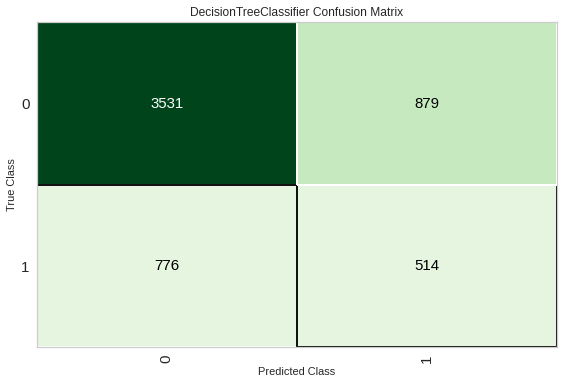

In [69]:
plot_model(dt , plot = 'confusion_matrix')

## Probar el modelo con los datos de validación

In [70]:
validation_predictions = predict_model(final_dt, data=validation_data)
validation_predictions.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.7192,0.6036,0.3899,0.3913,0.3906,0.2081,0.2081


,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default,Label,Score
0,360000,2,1,2,26,0,0,0,0,0,...,196.0,4796.0,3400.0,3100.0,146900.0,196.0,2963.0,0,0,1.0
1,360000,1,2,1,35,1,-2,-2,-2,-2,...,-103.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1.0
2,50000,2,2,2,22,-1,0,0,0,0,...,7725.0,15000.0,1000.0,149.0,0.0,5000.0,10000.0,0,0,1.0
3,100000,2,2,1,38,1,2,0,0,2,...,16448.0,0.0,1600.0,1500.0,0.0,1000.0,1500.0,1,0,1.0
4,210000,2,2,1,41,-1,-1,-1,-1,-1,...,0.0,1586.0,343.0,3763.0,877.0,0.0,419.0,1,0,1.0


## Guardar el modelo

In [73]:
save_model(dt,'DT_Credit_14Mayo2022')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='default',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_stra...
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                         criterion='gini', max_depth=None,
                        

## Cargando el modelo

Se debe poner sin la extención .pkl

In [74]:
saved_final_dt=load_model('/content/DT_Credit_14Mayo2022')

Transformation Pipeline and Model Successfully Loaded


In [75]:
new_prediction = predict_model(saved_final_dt, data=validation_data)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.7175,0.6041,0.3935,0.3893,0.3914,0.2075,0.2075


In [76]:
new_prediction.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default,Label,Score
0,360000,2,1,2,26,0,0,0,0,0,...,196.0,4796.0,3400.0,3100.0,146900.0,196.0,2963.0,0,1,1.0
1,360000,1,2,1,35,1,-2,-2,-2,-2,...,-103.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,1.0
2,50000,2,2,2,22,-1,0,0,0,0,...,7725.0,15000.0,1000.0,149.0,0.0,5000.0,10000.0,0,1,1.0
3,100000,2,2,1,38,1,2,0,0,2,...,16448.0,0.0,1600.0,1500.0,0.0,1000.0,1500.0,1,0,1.0
4,210000,2,2,1,41,-1,-1,-1,-1,-1,...,0.0,1586.0,343.0,3763.0,877.0,0.0,419.0,1,0,1.0


Vea que los resultados son los mismo, lo que verifica que el modelo se guardó correctamente

In [77]:
from pycaret.utils import check_metric
check_metric(new_prediction['default'], new_prediction['Label'], metric = 'Accuracy')

0.7175

## Ajustar los parámetros de un modelo

Cuando usamos la función create_model usa los parámetros por defecto, si queremos cambiarlos tenemos que usar la función tune_model. 

Esta función automáticamente hace una búsqueda de los mejores hiperparámetros del modelo.

In [22]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8170,0.7399,0.3753,0.6364,0.4722,0.3703,0.3891
1,0.8140,0.7484,0.3583,0.6321,0.4573,0.3553,0.3762
2,0.8146,0.7339,0.3235,0.6541,0.4329,0.3369,0.3668
3,0.8099,0.7334,0.3503,0.6150,0.4463,0.3419,0.3616
4,0.7942,0.7263,0.3102,0.5524,0.3973,0.2848,0.3020
5,0.7982,0.7118,0.3503,0.5622,0.4316,0.3169,0.3301
6,0.8193,0.7224,0.3743,0.6512,0.4754,0.3757,0.3967
7,0.8158,0.7178,0.3476,0.6468,0.4522,0.3533,0.3779
8,0.8041,0.7246,0.3075,0.6021,0.4071,0.3042,0.3289


In [23]:
print(tuned_dt)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=7,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=7, splitter='best')


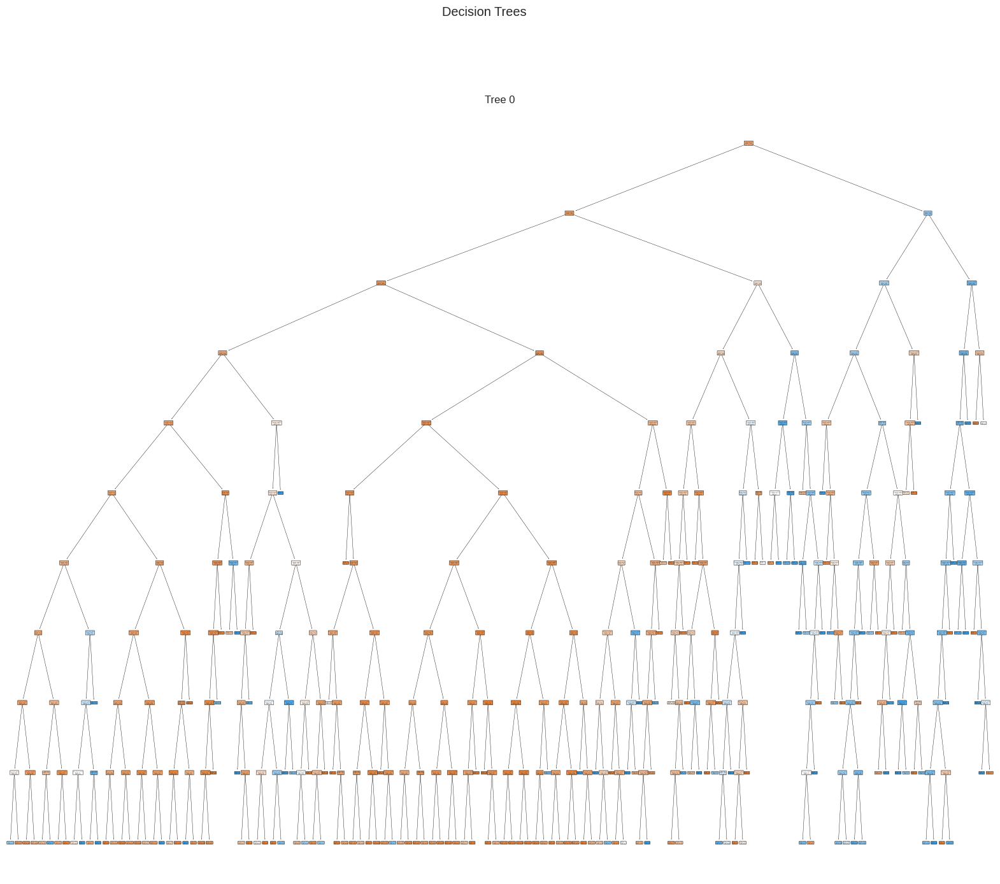

In [24]:
plot_model(tuned_dt,plot='tree');

In [25]:
import graphviz
from sklearn import tree

In [26]:
classes=dt.classes_
classes=classes.astype(str)

In [27]:
classes

array(['0', '1'], dtype='<U21')

In [28]:
graphviz.Source(tree.export_graphviz(dt,out_file=None,
                                             feature_names=list(get_config('X_train').columns),
                                             class_names=classes,filled=True,rounded=True)
)

## Crear un KNN

In [29]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7509,0.5953,0.1609,0.3468,0.2198,0.0946,0.1045
1,0.7433,0.5933,0.1551,0.3204,0.2090,0.0774,0.0847
2,0.7474,0.5925,0.1604,0.3371,0.2174,0.0889,0.0976
3,0.7585,0.6146,0.1979,0.3957,0.2638,0.1381,0.1500
4,0.7632,0.6291,0.1791,0.4061,0.2486,0.1324,0.1481
5,0.7556,0.6049,0.1711,0.3721,0.2344,0.1121,0.1241
6,0.7520,0.6017,0.1765,0.3626,0.2374,0.1100,0.1202
7,0.7620,0.5995,0.1738,0.3988,0.2421,0.1260,0.1414
8,0.7409,0.5845,0.1444,0.3051,0.1960,0.0646,0.0710


### Ajustando los parámetros del knn
Cuando queremos buscar entre un conjunto de parámetros podemos especificar el atributo y el rango a buscar.

Por ejemplo, buscar la k de del knn (n_neighbors) entre 1 y 50

In [30]:
np.arange(1,51,1)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50])

In [31]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(1,51,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7860,0.6592,0.0483,0.6207,0.0896,0.0600,0.1280
1,0.7801,0.6615,0.0428,0.4706,0.0784,0.0436,0.0868
2,0.7789,0.6369,0.0428,0.4444,0.0780,0.0412,0.0801
3,0.7871,0.6957,0.0668,0.6250,0.1208,0.0820,0.1521
4,0.7813,0.6702,0.0428,0.5000,0.0788,0.0459,0.0940
5,0.7772,0.6258,0.0374,0.4000,0.0685,0.0322,0.0634
6,0.7795,0.6344,0.0428,0.4571,0.0782,0.0424,0.0834
7,0.7836,0.6459,0.0455,0.5667,0.0842,0.0534,0.1125
8,0.7836,0.6303,0.0508,0.5588,0.0931,0.0588,0.1172


In [32]:
print(tuned_knn)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=48, p=2,
                     weights='uniform')


In [33]:
plot_model(tuned_knn, plot = 'parameter')

,Parameters
algorithm,auto
leaf_size,30
metric,minkowski
metric_params,None
n_jobs,-1
n_neighbors,48
p,2
weights,uniform


## Calibrar modelo según probabilidades
Al realizar la clasificación, a menudo no sólo desea predecir la etiqueta de clase (resultado como 0 o 1), sino también obtener la probabilidad del resultado respectivo que proporciona un nivel de confianza en la predicción. Algunos modelos pueden brindar estimaciones deficientes de las probabilidades de clase y algunos ni siquiera admiten la predicción de probabilidad. Los clasificadores bien calibrados son probabilísticos y proporcionan resultados en forma de probabilidades que pueden interpretarse directamente como un nivel de confianza. PyCaret le permite calibrar las probabilidades de un modelo dado a través de la función calibrate_model(). Vea un ejemplo a continuación:

In [34]:
dt=create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7304,0.6212,0.4263,0.3916,0.4082,0.2341,0.2344
1,0.7298,0.6211,0.4278,0.3922,0.4092,0.2345,0.2349
2,0.7269,0.6057,0.3904,0.3792,0.3847,0.2093,0.2093
3,0.7409,0.6349,0.4439,0.4140,0.4284,0.2612,0.2614
4,0.7199,0.5991,0.3850,0.3664,0.3755,0.1951,0.1952
5,0.7304,0.6099,0.3957,0.3864,0.3910,0.2179,0.2180
6,0.7216,0.6044,0.3930,0.3712,0.3818,0.2024,0.2025
7,0.7246,0.6129,0.4144,0.3808,0.3969,0.2189,0.2192
8,0.7374,0.6130,0.3930,0.3984,0.3957,0.2280,0.2280


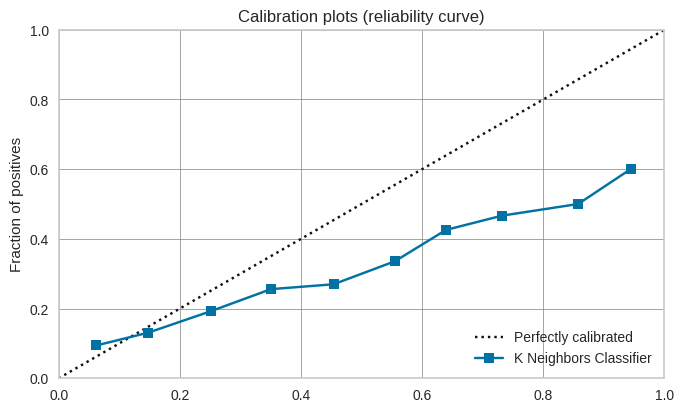

In [35]:
plot_model(tuned_knn, plot='calibration')

In [36]:
calibrated_knn = calibrate_model(tuned_knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7848,0.6601,0.0322,0.6316,0.0612,0.0409,0.1061
1,0.7789,0.6695,0.0241,0.4091,0.0455,0.0217,0.0526
2,0.7825,0.6379,0.0294,0.5500,0.0558,0.0344,0.0872
3,0.7848,0.6988,0.0267,0.7143,0.0515,0.0363,0.1089
4,0.7842,0.6651,0.0267,0.6667,0.0514,0.0351,0.1019
5,0.7801,0.6332,0.0267,0.4545,0.0505,0.0269,0.0651
6,0.7819,0.6381,0.0241,0.5294,0.0460,0.0275,0.0753
7,0.7830,0.6495,0.0321,0.5714,0.0608,0.0384,0.0951
8,0.7830,0.6337,0.0321,0.5714,0.0608,0.0384,0.0951


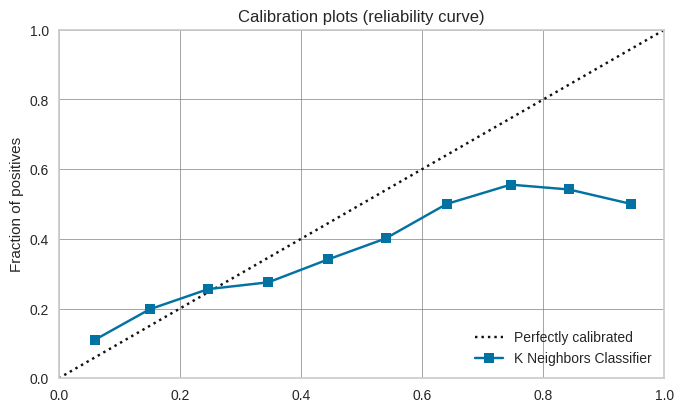

In [37]:
plot_model(calibrated_knn, plot='calibration')

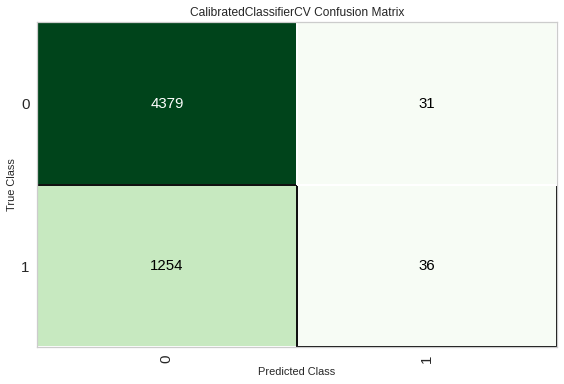

In [38]:
plot_model(calibrated_knn, plot='confusion_matrix')

In [39]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lda,Linear Discriminant Analysis,0.8230,0.7659,0.3771,0.6694,0.4823,0.3855,0.4086,0.200
ridge,Ridge Classifier,0.8226,0.0000,0.3600,0.6775,0.4700,0.3753,0.4024,0.058
lightgbm,Light Gradient Boosting Machine,0.8223,0.7785,0.3787,0.6646,0.4823,0.3847,0.4070,0.536
gbc,Gradient Boosting Classifier,0.8219,0.7829,0.3589,0.6750,0.4685,0.3733,0.4003,5.257
ada,Ada Boost Classifier,0.8181,0.7726,0.3338,0.6678,0.4449,0.3504,0.3806,1.083
rf,Random Forest Classifier,0.8179,0.7636,0.3667,0.6476,0.4680,0.3682,0.3900,2.637
et,Extra Trees Classifier,0.8093,0.7407,0.3742,0.6030,0.4616,0.3535,0.3684,2.089
lr,Logistic Regression,0.7813,0.6457,0.0008,0.3000,0.0016,0.0009,0.0099,0.764
dummy,Dummy Classifier,0.7813,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.042
knn,K Neighbors Classifier,0.7530,0.6041,0.1701,0.3627,0.2315,0.1067,0.1176,0.878


In [40]:
s2=setup(data = data, target = 'default', session_id=7,train_size=0.75, fix_imbalance = True)

,Description,Value
0,session_id,7
1,Target,default
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(22800, 24)"
5,Missing Values,False
6,Numeric Features,14
7,Categorical Features,9
8,Ordinal Features,False
9,High Cardinality Features,False


In [41]:
best_balanceM = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8221,0.7783,0.3728,0.6670,0.4782,0.3811,0.4047,10.233
lightgbm,Light Gradient Boosting Machine,0.8216,0.7760,0.3843,0.6578,0.4850,0.3860,0.4065,0.926
ada,Ada Boost Classifier,0.8212,0.7669,0.3875,0.6548,0.4865,0.3868,0.4065,2.319
rf,Random Forest Classifier,0.8171,0.7621,0.3942,0.6309,0.4851,0.3811,0.3967,3.871
et,Extra Trees Classifier,0.8088,0.7408,0.3870,0.5969,0.4693,0.3592,0.3719,3.654
ridge,Ridge Classifier,0.7827,0.0000,0.5584,0.5032,0.5292,0.3885,0.3896,0.230
lda,Linear Discriminant Analysis,0.7827,0.7646,0.5576,0.5031,0.5287,0.3881,0.3891,0.518
dummy,Dummy Classifier,0.7813,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.200
dt,Decision Tree Classifier,0.7226,0.6117,0.4143,0.3777,0.3950,0.2156,0.2160,0.570
knn,K Neighbors Classifier,0.6030,0.6028,0.5325,0.2832,0.3696,0.1178,0.1304,1.311


In [42]:
lda=create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7877,0.7530,0.5576,0.5123,0.5340,0.3969,0.3975
1,0.7982,0.7718,0.5882,0.5353,0.5605,0.4300,0.4308
2,0.7906,0.7765,0.5428,0.5205,0.5314,0.3967,0.3968
3,0.7743,0.7675,0.5535,0.4859,0.5175,0.3710,0.3723
4,0.7801,0.7595,0.5668,0.4977,0.5300,0.3873,0.3887
5,0.7713,0.7584,0.5642,0.4806,0.5191,0.3703,0.3724
6,0.7801,0.7753,0.5775,0.4977,0.5347,0.3917,0.3936
7,0.7877,0.7516,0.5294,0.5143,0.5217,0.3854,0.3854
8,0.7690,0.7521,0.5107,0.4739,0.4916,0.3425,0.3429


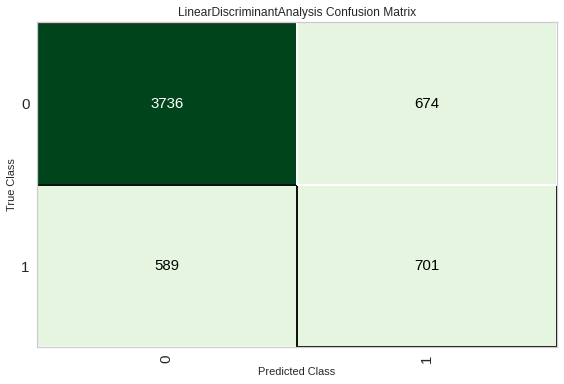

In [43]:
plot_model(lda,plot='confusion_matrix')

In [44]:
gbc=create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8304,0.7837,0.4048,0.6895,0.5101,0.4159,0.4374
1,0.8263,0.7942,0.3717,0.6915,0.4835,0.3902,0.4175
2,0.8257,0.7785,0.3663,0.6919,0.4790,0.3861,0.4143
3,0.8240,0.7821,0.3904,0.6667,0.4924,0.3946,0.4153
4,0.8099,0.7718,0.3529,0.6140,0.4482,0.3434,0.3626
5,0.8123,0.7666,0.3583,0.6233,0.4550,0.3515,0.3711
6,0.8287,0.7900,0.3904,0.6919,0.4991,0.4053,0.4295
7,0.8222,0.7643,0.3610,0.6750,0.4704,0.3751,0.4017
8,0.8140,0.7643,0.3476,0.6373,0.4498,0.3494,0.3726


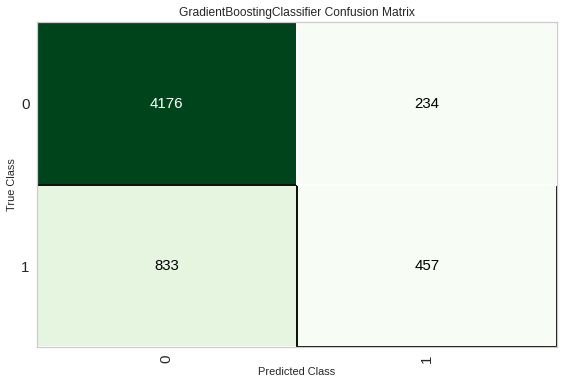

In [46]:
plot_model(gbc,plot='confusion_matrix')